<a href="https://colab.research.google.com/github/nikibhatt/DS-Unit-2-Applied-Modeling/blob/master/NB_project2_Alldata.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Lambda School Data Science

*Unit 2, Sprint 2, Module 1*

---

In [0]:
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Kaggle-Challenge/master/data/'
    !pip install category_encoders==2.*
    !pip install pandas-profiling==2.*
    !pip install pdpbox

# If you're working locally:
else:
    DATA_PATH = '../data/'

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split

listings = pd.read_csv('listings.csv')
listings_April2019 = pd.read_csv('listings_April2019.csv')
listings_Aug2019 = pd.read_csv('listings_Aug2019.csv')
listings_Aug2018 = pd.read_csv('listings_Aug2018.csv')
listings_Dec2018 = pd.read_csv('listings_Dec2018.csv')
listings_Feb2019 = pd.read_csv('listings_Feb2019.csv')
listings_Jan2019 = pd.read_csv('listings_Jan2019.csv')
listings_Jul2018 = pd.read_csv('listings_Jul2018.csv')
listings_Jul2019 = pd.read_csv('listings_Jul2019.csv')
listings_Jun2019 = pd.read_csv('listings_Jun2019.csv')
listings_Mar2019 = pd.read_csv('listings_Mar2019.csv')
listings_May2019 = pd.read_csv('listings_May2019.csv')
listings_Nov2018 = pd.read_csv('listings_Nov2018.csv')
listings_Oct2018 = pd.read_csv('listings_Oct2018.csv')
listings_Sep2018 = pd.read_csv('listings_Sep2018.csv')

listings_all = pd.concat([listings, listings_April2019, listings_Aug2019, listings_Aug2018,listings_Dec2018, listings_Feb2019, listings_Jan2019, 
                          listings_Jul2018, listings_Jul2019, listings_Jun2019, listings_Mar2019, listings_May2019, listings_Nov2018, listings_Oct2018, listings_Sep2018], ignore_index=True)

listings_all.shape

(97736, 16)

In [0]:
# Ignore this warning: https://github.com/dmlc/xgboost/issues/4300
# xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning, module='xgboost')

In [0]:
listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,4952,Butterfly Inn - Graceful Living !,7054,Mei Lin,NaN,Palo Alto,37.43972,-122.15672,Private room,90,2,75,2019-01-12,0.61,5,52
1,11464,Deluxe Private Studio-custom int.,42458,Emey,NaN,Santa Clara,37.34342,-121.98829,Entire home/apt,85,14,5,2018-08-26,0.08,10,90
2,21373,Bonsai Garden Inn in Professorville,7054,Mei Lin,NaN,Palo Alto,37.44001,-122.15667,Private room,99,2,240,2019-09-15,2.12,5,276
3,23732,Heart of Silicon Valley bdrm & bath,2077,Igor,NaN,Mountain View,37.39203,-122.06675,Private room,299,1,3,2011-07-07,0.03,1,365
4,37154,Private room in a 2 bedroom home in Campbell,160433,Daniel,NaN,San Jose,37.30213,-121.95890,Private room,61,2,36,2019-09-13,2.41,1,26


In [7]:
import plotly.express as px 

px.scatter(listings_all, x='longitude', y='latitude', color='price', opacity=0.1)

In [9]:
fig = px.scatter_mapbox(listings_all, lat="latitude", lon="longitude", hover_name="neighbourhood", hover_data=["price"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [0]:
import pandas_profiling

profile_report = listings.profile_report(
    check_correlation_pearson=False,
    correlations={
        'pearson': False,
        'spearman': False,
        'kendall': False,
        'phi_k': False,
        'cramers': False,
        'recoded': False,
    },
    plot={'histogram': {'bayesian_blocks_bins': False}},
)

profile_report

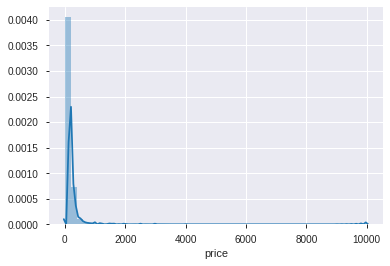

In [0]:
%matplotlib inline
import seaborn as sns
sns.distplot(listings['price']);

In [0]:
listings['last_review'].value_counts()

2019-09-13    223
2019-09-02    203
2019-09-01    203
2019-09-12    168
2019-08-31    162
             ... 
2017-07-31      1
2019-04-11      1
2018-08-16      1
2018-01-24      1
2016-11-10      1
Name: last_review, Length: 637, dtype: int64

In [0]:
# Target appeared right-skewed so need to apply log transformation

import numpy as np
price_log = np.log1p(listings['price'])

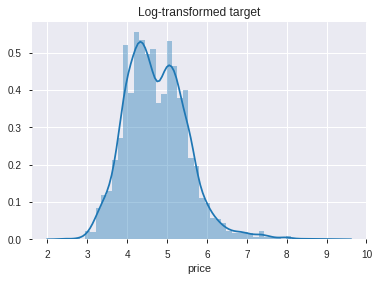

In [0]:
import matplotlib.pyplot as plt

sns.distplot(price_log)
plt.title('Log-transformed target'); # price here is log dollars

In [0]:
listings = listings[(listings['price'] >= np.percentile(listings['price'], 0.5)) & 
        (listings['price'] <= np.percentile(listings['price'], 99.5)) & 
        (listings['latitude'] >= np.percentile(listings['latitude'], 0.05)) & 
        (listings['latitude'] < np.percentile(listings['latitude'], 99.95)) &
        (listings['longitude'] >= np.percentile(listings['longitude'], 0.05)) & 
        (listings['longitude'] <= np.percentile(listings['longitude'], 99.95))]

In [0]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(listings, test_size=0.2)
train, val = train_test_split(train, test_size=0.2)

In [0]:
train.shape, val.shape, test.shape

((4758, 16), (1190, 16), (1487, 16))

In [38]:
# The status_group column is the target
target = 'price'

# Get a dataframe with all train columns except the target & id
train_features = train.drop(columns=[target, 'id', 'neighbourhood_group'])

# Get a list of the numeric features
numeric_features = train_features.select_dtypes(include='number').columns.tolist()

# Get a series with the cardinality of the nonnumeric features
cardinality = train_features.select_dtypes(exclude='number').nunique()

# Get a list of all categorical features with cardinality <= 50
categorical_features = cardinality[cardinality <= 50].index.tolist()

# Combine the lists 
features = numeric_features + categorical_features
print(features)

['host_id', 'latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'neighbourhood', 'room_type']


In [0]:
X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]

In [0]:
#Linear Regression

import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True), 
    SimpleImputer(strategy='mean'), 
    LinearRegression()
)

In [0]:
# Try Decision Tree

from sklearn.tree import DecisionTreeRegressor

pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True), 
    SimpleImputer(strategy='mean'), 
    DecisionTreeRegressor(criterion='mse',max_depth=100)
)

In [0]:
# Try Random Forest

from sklearn.ensemble import RandomForestRegressor

pipeline = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
    RandomForestRegressor(n_estimators = 500, random_state = 42)
)

In [41]:
# Apply logarithmic transformation to data set before fitting the model

# using LinearRegression is better

from sklearn.metrics import mean_absolute_error, r2_score
import numpy as np

y_train_log = np.log1p(y_train)
y_val_log = np.log1p(y_val)
pipeline.fit(X_train, y_train_log)
y_pred_log = pipeline.predict(X_val)
y_pred = np.expm1(y_pred_log)
print('MAE for LR: ', mean_absolute_error(y_val, y_pred))
print('R2 Score for LR: ', r2_score(y_val, y_pred))

MAE for LR:  85.04460369489112
R2 Score for LR:  0.05881773662261569


In [0]:
# using DecisionTreeRegressor is worse

from sklearn.metrics import mean_absolute_error

y_train_log = np.log1p(y_train)
y_val_log = np.log1p(y_val)
pipeline.fit(X_train, y_train_log)
y_pred_log = pipeline.predict(X_val)
y_pred = np.expm1(y_pred_log)
print(mean_absolute_error(y_val, y_pred))

70.3793991416309


In [43]:
# using RandomForestRegressor is best

from sklearn.metrics import mean_absolute_error

y_train_log = np.log1p(y_train)
y_val_log = np.log1p(y_val)
pipeline.fit(X_train, y_train_log)
y_pred_log = pipeline.predict(X_val)
y_pred = np.expm1(y_pred_log)
print('MAE for RFR: ', mean_absolute_error(y_val, y_pred))
print('R2 Score for RFR: ', r2_score(y_val, y_pred))

MAE for RFR:  75.8377462901458
R2 Score for RFR:  0.14726739833503


In [0]:
rf.feature_importances_

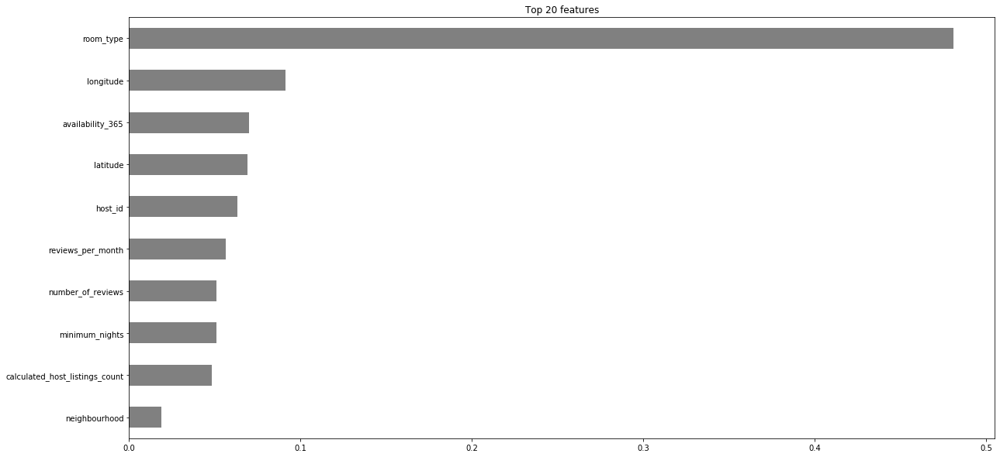

In [45]:
# Get feature importances
rf = pipeline.named_steps['randomforestregressor']
importances = pd.Series(rf.feature_importances_, X_train.columns)

# Plot feature importances
%matplotlib inline
import matplotlib.pyplot as plt

n = 20
plt.figure(figsize=(20,n/2))
plt.title(f'Top {n} features')
importances.sort_values()[-n:].plot.barh(color='grey');

In [0]:
X_train.columns

Index(['host_id', 'latitude', 'longitude', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365', 'neighbourhood',
       'room_type'],
      dtype='object')

In [0]:
# Using Gradient Boosting (almost as good as linear regression)

from xgboost import XGBRFRegressor

pipeline = make_pipeline(
    ce.OrdinalEncoder(),
    XGBRFRegressor(n_estimators=500, random_state=42, n_jobs=-1, objective ='reg:squarederror', max_depth=50, alpha = 100 )
)

pipeline.fit(X_train, y_train)

In [47]:

y_train_log = np.log1p(y_train)
y_val_log = np.log1p(y_val)
pipeline.fit(X_train, y_train_log)
y_pred_log = pipeline.predict(X_val)
y_pred = np.expm1(y_pred_log)
print('MAE for GB: ', mean_absolute_error(y_val, y_pred))
print('R2 Score for GB: ', r2_score(y_val, y_pred))


MAE for GB:  84.97251679236147
R2 Score for GB:  0.0816747144488561


In [26]:
X_val['room_type'].describe()

count                1190
unique                  4
top       Entire home/apt
freq                  566
Name: room_type, dtype: object

In [0]:
#PDP Partial dependence plot

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 72
from pdpbox.pdp import pdp_isolate, pdp_plot

# Use Ordinal Encoder, outside of a pipeline
encoder = ce.OrdinalEncoder()
X_encoded = encoder.fit_transform(X_train)

model = XGBRFRegressor(n_estimators=500, random_state=42, n_jobs=-1, objective ='reg:squarederror', max_depth=50, alpha = 100 )
model.fit(X_encoded, y_train)

In [0]:
# Use Pdpbox - Automated version

feature = 'room_type'
for item in encoder.mapping:
    if item['col'] == feature:
        feature_mapping = item['mapping']
        
feature_mapping = feature_mapping[feature_mapping.index.dropna()]
category_names = feature_mapping.index.tolist()
category_codes = feature_mapping.values.tolist()

pdp_plot(pdp_dist, feature)

# Automatically change the xticks labels
plt.xticks(category_codes, category_names);

In [0]:
# Use Pdpbox - Manual version

%matplotlib inline

feature = 'room_type'
pdp_dist = pdp_isolate(model=model, dataset=X_encoded, model_features=features, feature=feature)
pdp_plot(pdp_dist, feature);

In [33]:
# Look at the encoder's mappings
encoder.mapping

[{'col': 'room_type', 'data_type': dtype('O'), 'mapping': Hotel room         1
  Entire home/apt    2
  Private room       3
  Shared room        4
  NaN               -2
  dtype: int64}]

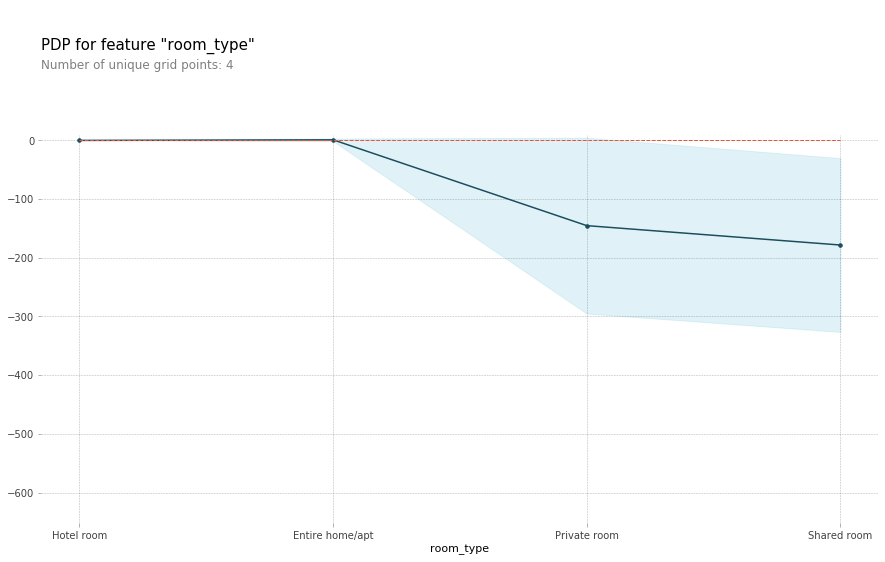

In [34]:
pdp_plot(pdp_dist, feature)

# Manually change the xticks labels
plt.xticks([1, 2, 3, 4], ['Hotel room', 'Entire home/apt', 'Private room', 'Shared room']);

In [53]:
encoder.mapping

[{'col': 'neighbourhood',
  'data_type': dtype('O'),
  'mapping': San Jose                 1
  Mountain View            2
  Palo Alto                3
  Sunnyvale                4
  Cupertino                5
  Milpitas                 6
  Los Gatos                7
  Saratoga                 8
  Santa Clara              9
  Unincorporated Areas    10
  Los Altos               11
  Campbell                12
  Morgan Hill             13
  Los Altos Hills         14
  Gilroy                  15
  Monte Sereno            16
  NaN                     -2
  dtype: int64},
 {'col': 'room_type', 'data_type': dtype('O'), 'mapping': Hotel room         1
  Entire home/apt    2
  Private room       3
  Shared room        4
  NaN               -2
  dtype: int64}]

(None, <a list of 0 Text xticklabel objects>)

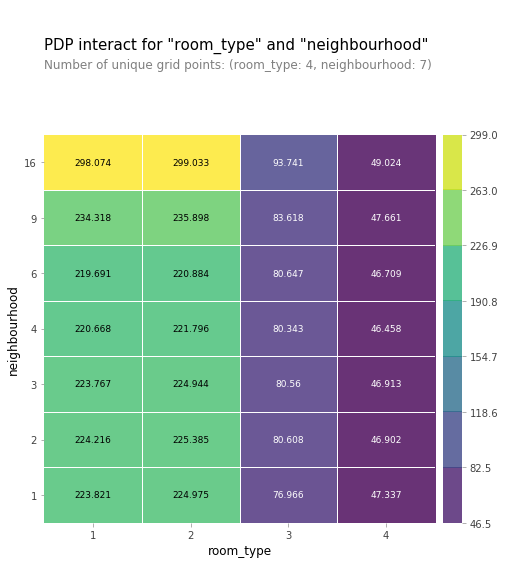

In [59]:
#PDP with 2 features

features = ['room_type', 'neighbourhood']

from pdpbox.pdp import pdp_interact_plot, pdp_interact

interaction = pdp_interact(
    model=model, 
    dataset=X_encoded, 
    model_features=X_encoded.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', feature_names=features)
plt.xticks([1, 2, 3, 4], ['Hotel room', 'Entire home/apt', 'Private room', 'Shared room'])

# Manually change the xticks labels


#plt.yticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], ['San Jose', 'Mountain View', 'Palo Alto', 'Sunnyvale', 'Cupertino', 'Milpitas', 
#                                                                     'Los Gatos', 'Saratoga', 'Santa Clara', 'Unincorporated Areas', 'Los Altos', 
#                                                                     'Campbell', 'Morgan Hill', 'Los Altos Hills', 'Gilroy', 'Monte Sereno'])


In [0]:
# With ELI5 library. This wont work unless its only numeric features

!pip install eli5

import eli5 
from eli5.sklearn import PermutationImportance

permuter = PermutationImportance(
    pipeline,
    scoring='accuracy',
    n_iter=5,
    random_state=42
)
permuter.fit(X_val, y_val)